<a href="https://colab.research.google.com/github/quinmeh/wildfire_detection_research_2024/blob/main/tiff_to_png.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
pip install rasterio


     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 21.5/21.5 MB 39.2 MB/s eta 0:00:00


In [ ]:
import os
import rasterio
from rasterio.plot import show
import numpy as np
import matplotlib.pyplot as plt



In [ ]:
# Define input and output directories
input_dir = "/content/drive/Shareddrives/ESEARCH_Spring_2024/Data/wildfire/sentinel2_tiff"
output_dir = "/content/drive/Shareddrives/ESEARCH_Spring_2024/Data/wildfire/sentinel2_RGB"
# Make sure output directory exists, create it if not
if not os.path.exists(output_dir):
    os.makedirs(output_dir)
# List all TIFF files in the input directory
input_files = [f for f in os.listdir(input_dir) if f.endswith('.tif')]

In [ ]:
input_files

["Sentinel_2(2020-08-15', '2020-08-25)_Image.tif",
 'Sentinel_2-1_Image.tif',
 'Sentinel_2-2_Image.tif',
 'Sentinel_2-4_Image.tif',
 'Sentinel_2-5_Image.tif',
 'Sentinel_2-6_Image.tif',
 'Sentinel_2-7_Image.tif',
 'Sentinel_2-8_Image.tif',
 'Sentinel_2-9_Image.tif',
 'Sentinel_2-10_Image.tif',
 'Sentinel_2-11_Image.tif',
 'Sentinel_2-12_Image.tif',
 'Sentinel_2-13_Image.tif',
 'Sentinel_2-14_Image.tif',
 'Sentinel_2-15_Image.tif',
 'Sentinel_2-16_Image.tif',
 'Sentinel_2-17_Image.tif',
 'Sentinel_2-18_Image.tif',
 'Sentinel_2-19_Image.tif',
 'Sentinel_2-20_Image.tif',
 'Sentinel_2-21_Image.tif',
 'Sentinel_2-22_Image.tif',
 'Sentinel_2-23_Image.tif',
 'Sentinel_2-24_Image.tif',
 'Sentinel_2-25_Image.tif',
 'Sentinel_2-26_Image.tif',
 'Sentinel_2-27_Image.tif',
 'Sentinel_2-28_Image.tif',
 'Sentinel_2-29_Image.tif',
 'Sentinel_2-30_Image.tif',
 'Sentinel_2-31_Image.tif',
 'Sentinel_2-32_Image.tif',
 'Sentinel_2-33_Image.tif',
 'Sentinel_2-34_Image.tif',
 'Sentinel_2-35_Image.tif',
 'Sen

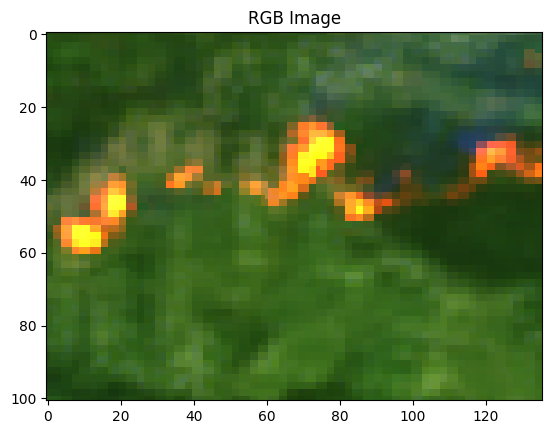

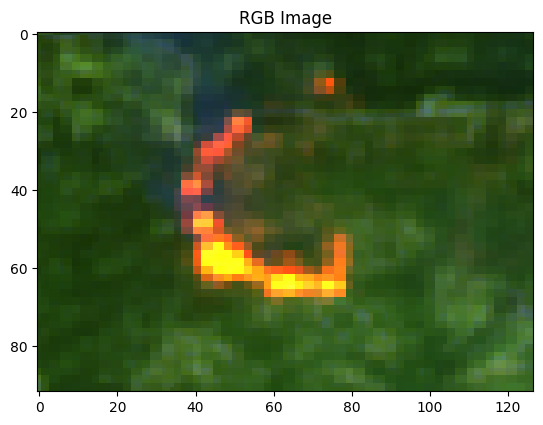

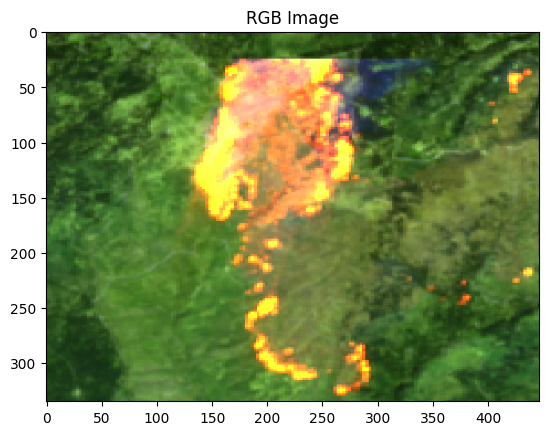

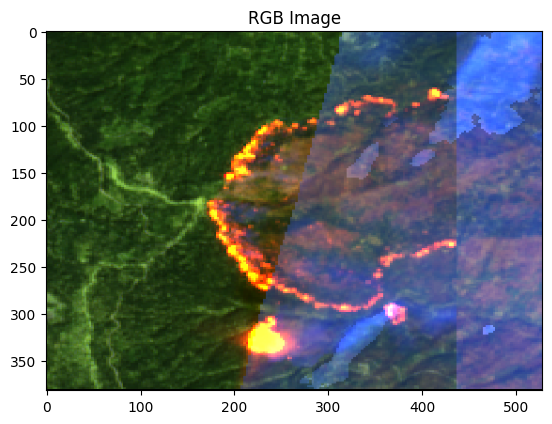

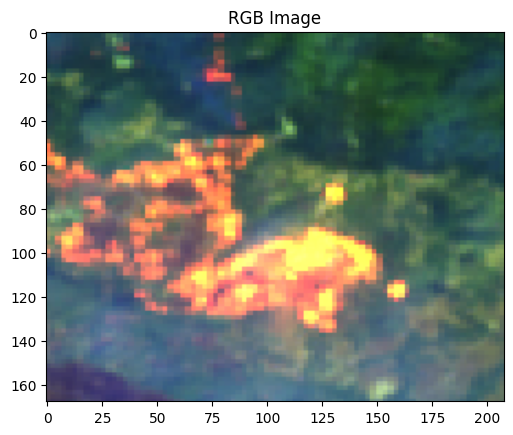

...

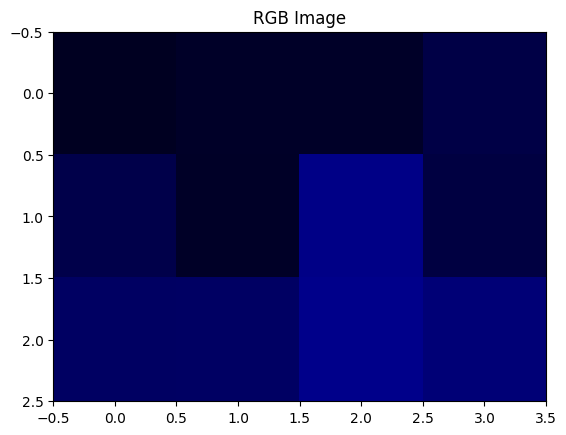

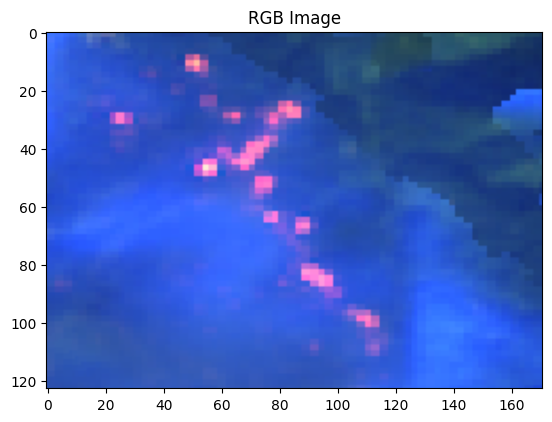

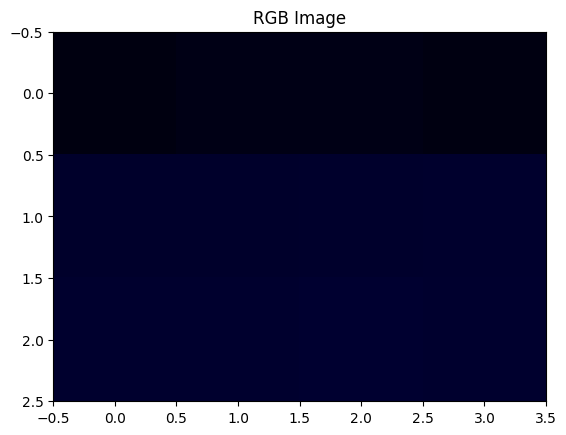

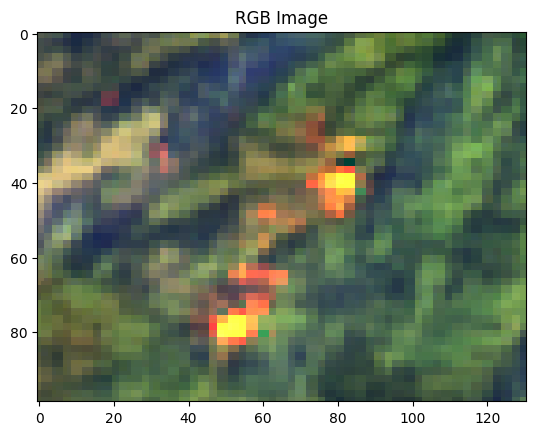

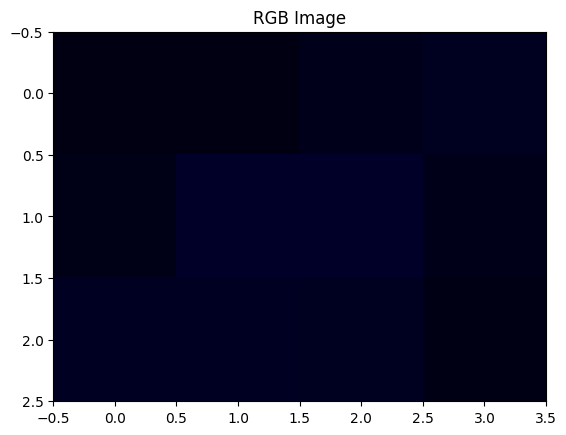

In [ ]:
# Loop through each TIFF file
for input_file in input_files:
    # Open the TIFF file
    with rasterio.open(os.path.join(input_dir, input_file)) as src:
        # Read bands 12, 11, and 4 (indices are 11, 10, and 3 as Python is 0-indexed)
        band12 = src.read(12)
        band11 = src.read(11)
        band4 = src.read(4)
        # Normalize pixel values to 0-1 range
        band12 = np.clip(band12 / 4096, 0, 1)
        band11 = np.clip(band11 / 4096, 0, 1)
        band4 = np.clip(band4 / 4096, 0, 1)
        # Stack bands to create RGB image
        rgb_image = np.dstack((band12, band11, band4))
        # Plot and display the RGB image
        plt.imshow(rgb_image)
        plt.axis('on')
        plt.title('RGB Image')
        plt.show()
        # Save the RGB image as PNG
        output_file = os.path.splitext(input_file)[0] + '_RGB.png'
        output_path = os.path.join(output_dir, output_file)
        plt.imsave(output_path, rgb_image)